<h1>Discretization of the Langevin dynamics and its Metropolization</h1>

<a id='langevin'></a>
<h2>The Langevin dynamics</h2>

It is a phenomenological model of a Hamiltonian system coupled with a thermostat (infinite reservoir of energy). The thermostat models the heat exchanges between the system and its environment (<i>e.g.</i> through collisions).

We denote by $d$ the dimension (we will consider $d=2$ in our numerical examples), and $N$ the number of particles composing the system at hand. The corresponding stochastic equations of motion read
$$
\left\lbrace
\begin{aligned}
{\rm d}q_t &= \nabla_p H(q_t,p_t)\,{\rm d}t,\\
{\rm d}p_t &= -\nabla_q H(q_t,p_t)\,{\rm d}t-\gamma(q_t)\nabla_p H(q_t,p_t)\,{\rm d}t+\sigma(q_t)\,{\rm d}W_t,
\end{aligned}
\right.
$$
where:
* $(q_t,p_t)\in\mathbb{R}^{dN\times dN}$ denotes the state of the system, $q_t$ being the positions of the particles and $p_t$ their momenta;
* $t\mapsto W_t$ is a $dN$-dimensional standard Brownian motion;
* $H$ is the Hamiltonian of the system. We will consider a separable Hamiltonian function of the form
$$
H(q,p)=V(q)+\frac{1}{2}p^{\mathsf{T}}M^{-1}p,
$$
with $M={\rm diag}([m_i]_d)_{1\leqslant i\leqslant N}$ the mass matrix ($m_i$ is the mass of the $i$-th particle, appearing $d$ times in a row in the diagonal of $M$) and $V:\mathbb{R}^{dN}\to\mathbb{R}$ is a (smooth) potential energy function;
* $\sigma:\mathbb{R}^{dN}\to\mathcal{M}_{dN}(\mathbb{R})$ and $\gamma:\mathbb{R}^{dN}\to\mathcal{M}_{dN}(\mathbb{R})$ output real matrices. We will consider only isotropic outputs and consider $\gamma,\sigma$ to be (positive) scalars. The term $\sigma{\rm d}W_t$ is a fluctuation term bringing energy into the system, while this energy is being dissipated by the viscous friction term $-\gamma\nabla_p H(q_t,p_t)\,{\rm d}t=-\gamma M^{-1}p_t\,{\rm d}t$. These two terms are related through the <i>fluctuation-dissipation</i> relation:
$$
\sigma\sigma^{\mathsf{T}}=\frac{2\gamma}{\beta}.
$$

We will therefore consider the following stochastic differential equations:
$$
\tag{Langevin}
\left\lbrace
\begin{aligned}
{\rm d}q_t &= \textcolor{blue}{M^{-1}p_t\,{\rm d}t},\\
{\rm d}p_t &= \textcolor{blue}{-\nabla V(q_t)\,{\rm d}t}\textcolor{red}{-\gamma M^{-1}p_t\,{\rm d}t+\sqrt{\frac{2\gamma}{\beta}}{\rm d}W_t},
\end{aligned}
\right.
$$
The $\textcolor{blue}{\rm blue}$ part are the Hamilton's equations of motion, the $\textcolor{red}{\rm red}$ part is an Ornstein-Uhlenbeck process. A possible numerical integration of this process is based on a splitting strategy, considering separately a consistant discretization of the Ornstein-Uhlenbeck process (exact solution, Euler schemes) and a numerical integration of the Hamiltonian dynamics (Störmer-Verlet/leapfrog integrator).

<h2>Numerical implementation</h2>

We note by $\Delta t>0$ the time step used to integrate the dynamics.

<h3>Hamilton's equations</h3>

Hamiltonian dynamics are commonly numerically integrating using the Störmer-Verlet algorithm, which is a composition of the symplectic Euler A and B schemes. Given a configuration $(q^0,p^0)$ the symplectic Euler A scheme reads
$$
\tag{Euler A}
\left\lbrace
\begin{aligned}
q^1 &= q^0 + \Delta t M^{-1}p^0,\\
p^1 &= p^0 - \Delta t\nabla V(q^1),
\end{aligned}
\right.
$$
while the symplectic Euler B scheme reads
$$
\tag{Euler B}
\left\lbrace
\begin{aligned}
q^1 &= q^0 + \Delta t M^{-1}p^1,\\
p^1 &= p^0 - \Delta t\nabla V(q^0).
\end{aligned}
\right.
$$
The (velocity) Verlet integrator is a composition of half-steps of Euler B and Euler A, and therefore reads
$$
\tag{Störmer--Verlet}
\left\lbrace
\begin{aligned}
p^{1/2} &= p^0-\frac{\Delta t}{2}\nabla V(q^0)\\
q^1 &= q^0 +\Delta t M^{-1}p^{1/2},\\
p^1 &= p^{1/2}-\frac{\Delta t}{2}\nabla V(q^1).
\end{aligned}
\right.
$$

Often, a A step corresponds to only updating the positions (and keeping the momenta fixed), while a B step corresponds to only updating the momenta (with the positions fixed). We shall use this notation later when naming numerical integrators based on splitting strategies:
$$
\begin{align}
\tag{A}
(q^1,p^1)&=\varphi_{\Delta t}^{\rm A}(q^0,p^0)=(q^0+\Delta t M^{-1}p^0, p^0),\\
\tag{B}
(q^1,p^1)&=\varphi_{\Delta t}^{\rm B}(q^0,p^0)=(q^0, p^0-\Delta t\nabla V(q^0)).
\end{align}
$$

<a id='ou_process'></a>
<h3>Ornstein-Uhlenbeck process</h3>

The analytical solution of the Ornstein-Uhlenbeck process is known: if $q_0$ is the inital momenta at time $t=0$, then
$$
p_t = {\rm e}^{-\gamma M^{-1}t}p_0 + \sqrt{\frac{2\gamma}{\beta}}\int_{0}^t {\rm e}^{-\gamma M^{-1}(t-s)}{\rm d}W_s.
$$
This is a Gaussian process with mean ${\rm e}^{-\gamma M^{-1}t}p_0$ and covariance matrix
$$
\frac{2\gamma}{\beta}\int_{0}^t {\rm e}^{-2\gamma M^{-1}(t-s)}ds=\frac{1}{\beta}({\rm I}_{dN}-{\rm e}^{-2\gamma M^{-1}t})M.
$$
Therefore, a consistent discretization of the Ornstein-Uhlenbeck process over the time interval $[0,\Delta t]$ is
$$
\tag{O}
p^1 = {\rm e}^{-\gamma M^{-1}\Delta t}p^0 + \sqrt{\frac{\left({\rm I}_{dN}-{\rm e}^{-2\gamma M^{-1}\Delta t}\right)M}{\beta}}{\rm G}^1,\qquad {\rm G}^1\sim\mathcal{N}(0,{\rm I}_{dN}).
$$
We shall also note this update with $\varphi_{\Delta t}^{\rm O}(q^0,p^0)=(q^0,p^1)$ with $p^1$ defined above (even though this is not a numerical flow since noise is introduced).

<h3>A splitting strategy</h3>

A common choice to integrate the Langevin dynamics is the BAOAB integrator: as hinted by the letters, it performs a half B step, a half A step, a full O step, and then again a half A step and half B step:
$$
\varphi_{\Delta t}^{\rm BAOAB}=\varphi_{\Delta t/2}^{\rm B}\varphi_{\Delta t/2}^{\rm A}\varphi_{\Delta t}^{\rm O}\varphi_{\Delta t/2}^{\rm A}\varphi_{\Delta t/2}^{\rm B}.
$$

<b><u>Question.</u> How many forces computations (call to the function $\nabla V$) are needed per step for the BAOAB integrator ?</b>

<h2>A 2D toy example</h2>

We consider a system composed of $N=1$ particle of mass 1 in dimension $d=2$, under the influence of a potential energy function $V$ which writes
$$
\tag{Entropic switch}
V(x,y)=3{\rm e}^{-x^2}({\rm e}^{-(y-1/3)^2}-{\rm e}^{-(y-5/3)^2})-5{\rm e}^{-y^2}({\rm e}^{-(x-1)^2}+{\rm e}^{-(x+1)^2})+0.2x^4+0.2(y-1/3)^4.
$$
The potential energy function $V$ has two deep wells centered at $q_{\rm L}=(-1.048, -0.04210),q_{\rm R}=(1.048, -0.04210)$, and a shallow well around $q_{\rm S}=(0., 1.5371)$.

In [1]:
"""
    entropic_switch(x, y)

Potential energy function.
"""
function entropic_switch(x, y)
    tmp1 = x^2
    tmp2 = (y - 1 / 3)^2
    return 3 * exp(-tmp1) * (exp(-tmp2) - exp(-(y - 5 / 3)^2)) - 5 * exp(-y^2) * (exp(-(x - 1)^2) + exp(-(x + 1)^2)) + 0.2 * tmp1^2 + 0.2 * tmp2^2
end

function entropic_switch(q::Vector)
    return entropic_switch(q...)
end

"""
    ∇entropic_switch(x, y)

Gradient of the potential energy function.
"""
function ∇entropic_switch(x, y)

    tmp1 = exp(4*x)
    tmp2 = exp(-x^2 - 2*x - y^2 - 1)
    tmp3 = exp(-x^2)
    tmp4 = exp(-(y-1/3)^2)
    tmp5 = exp(-(y-5/3)^2)

    dx = 0.8*x^3 + 10*(tmp1*(x - 1) + x + 1)*tmp2 - 6*tmp3*x*(tmp4 - tmp5)

    dy = 10*(tmp1 + 1)*y*tmp2 + 3*tmp3*(2*tmp5*(y - 5/3) - 2*tmp4*(y - 1/3)) + 0.8*(y - 1/3)^3

    return [dx, dy]
end

function ∇entropic_switch(q::Vector)
    return ∇entropic_switch(q...)
end
;

The following script outputs a contour plot of $V$.

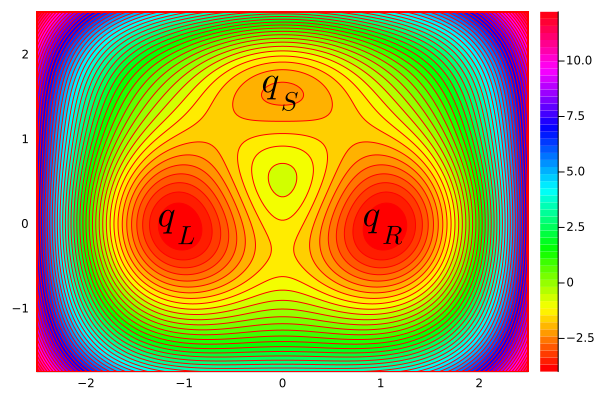

In [2]:
# First time compiling Plots takes a bit of time
using Plots, LaTeXStrings

xlims = -2.5, 2.5
ylims = -1.75, 2.5
xrange = range(xlims..., 200)
yrange = range(ylims..., 200)
qₗ = (-1.048, -0.04210, Plots.text(L"$q_{\rm L}$", pointsize=25))
qᵣ = (1.048, -0.04210, Plots.text(L"$q_{\rm R}$", pointsize=25))
qₛ = (0., 1.5371, Plots.text(L"$q_{\rm S}$", pointsize=25))
pl_V = contourf(xrange, yrange, entropic_switch, levels=50, cmap=:hsv)
annotate!(qₗ)
annotate!(qᵣ)
annotate!(qₛ)

<a id='baoab'></a>
We now define the BAOAB integrator.

<i>Julia particularities</i>
* The ```!``` at the end of the function name is to indicate that this function modifies the input.
* Had we only specified ```p⁰ -= Δt * ∇V⁰ / 2```, only the reference of the vector would have beed copied, not the content.
* Ensure to pass Float vectors, otherwise the computations won't work. It is made mandatory here, as the force function ($-\nabla V$) will return float values anyway.

In [3]:
"""
    BAOAB!(q⁰::Vector{Float64}, p⁰::Vector{Float64}, Δt, β, γ, ∇V::Function, ∇V⁰::Vector{Float64}, G¹::Vector{Float64})

BAOAB integrator for the Langevin dynamics. (q⁰,p⁰) is the initial configuration, Δt the time step, β the inverse temperature, γ the friction parameter, ∇V the negative force field, ∇V⁰ the gradient of V evaluated at (q⁰,p⁰), G¹ is drawn from the standard Gaussian distribution.

The updated configuration (q¹,p¹) is stored in place of (q⁰,p⁰), as well as the gradient of the updated position.
"""
function BAOAB!(q⁰::Vector{Float64}, p⁰::Vector{Float64}, Δt, β, γ, ∇V::Function, ∇V⁰::Vector{Float64}, G¹::Vector{Float64})
    p⁰[:] -= Δt * ∇V⁰ / 2
    q⁰[:] += Δt * p⁰ / 2
    p⁰[:] = exp(-γ*Δt)*p⁰ + sqrt((1-exp(-2*γ*Δt))/β)*G¹
    q⁰[:] += Δt * p⁰ / 2
    ∇V⁰[:] = ∇V(q⁰)
    p⁰[:] -= Δt * ∇V⁰ / 2
end
;

We define a basic function to simulate the Langevin dynamics over a period of time.

In [4]:
"""
    simulate(q⁰::Vector{Float64}, p⁰::Vector{Float64}, Δt, T, β, γ, ∇V::Function)

TBW
"""
function simulate(q⁰::Vector{Float64}, p⁰::Vector{Float64}, Δt, T, β, γ, ∇V::Function)

    # Get the number of iterations
    Nit = round(Int, T/Δt)

    # Holds the positions over time
    positions = Array{Float64,2}(undef, Nit, 2)
    positions[1,:] = q⁰

    # Holds the momenta over time
    momenta = Array{Float64,2}(undef, Nit, 2)
    momenta[1,:] = p⁰

    # Compute first gradient
    ∇V⁰ = ∇V(q⁰)

    # Get the noise needed for all the trajectory
    noise = randn(Nit-1, 2)

    for i in 2:Nit
        
        #Simple logger to standard cout
        if i % 100000 == 0
            println("Iteration $(i)/$(Nit)")
        end

        # Integrate one step
        G = noise[i-1, :]
        BAOAB!(q⁰,p⁰,Δt,β,γ,∇V,∇V⁰,G)

        # Update the trajectory
        positions[i,:] = q⁰
        momenta[i,:] = p⁰
    end

    return positions, momenta
end

simulate

We are now ready to get a sample trajectory.

In [5]:
T = 10000. # Simulation time
Δt = 0.01 # Time step
γ = 1. # Friction parameter
β = 1. # Inverse temperature
Nit = round(Int, T/Δt) # Number of iterations

# Initial configuration
q⁰ = [-2,-1.5]+4*rand(2)
p⁰ = randn(2)/sqrt(β)
;

In [6]:
# Get the whole trajectory
println("Computing the Langevin dynamics for $(Nit) iterations")
positions, momenta = simulate(q⁰, p⁰, Δt, T, β,γ,∇entropic_switch)

x = positions[:,1]
y = positions[:,2]
;

Computing the Langevin dynamics for 1000000 iterations


Iteration 100000/1000000


Iteration 200000/1000000


Iteration 300000/1000000


Iteration 400000/1000000


Iteration 500000/1000000


Iteration 600000/1000000


Iteration 700000/1000000


Iteration 800000/1000000


Iteration 900000/1000000


Iteration 1000000/1000000


We can plot the trajectory over time.

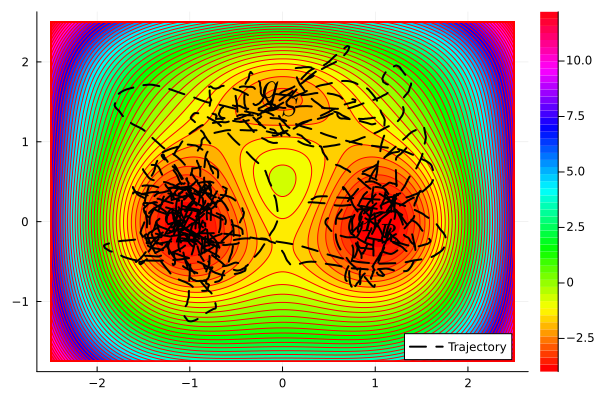

In [7]:
# Plot only beginning of the trajectory
Nmax = min(10000,length(x))
plot(pl_V)
plot!(x[1:Nmax],y[1:Nmax],label="Trajectory", linestyle=:dash, color=:black, linewidth=2)

<h3>Some sanity checks</h3>
* we expect to see the conservation of the total energy of the system over time, <i>i.e.</i> the Hamiltonian, up to fluctuations;
* the momenta should be distributed following the standard Gaussian distribution (up to a factor $\beta$ in the covariance).

<i>Julia particularities</i>
* ```'``` is the adjoint operator for Array structures.
* ```...``` is the "splat" operator, which unpacks an Array, equivalent to ```*``` in Python for example. It is used here to apply a function to a sequence of arguments.

In [8]:
function hamiltonian(q::Vector,p::Vector,V::Function)
    return V(q) + p'*p/2
end

function standard_gaussian(x)
    global β
    return exp(-β*x^2/2)*sqrt(β/(2*π))
end

function standard_gaussian(x,y)
    global β
    return exp(-β*(x^2+y^2)/2)*β/(2*π)
end

function standard_gaussian(p::Vector)
    return standard_gaussian(p...)
end
;

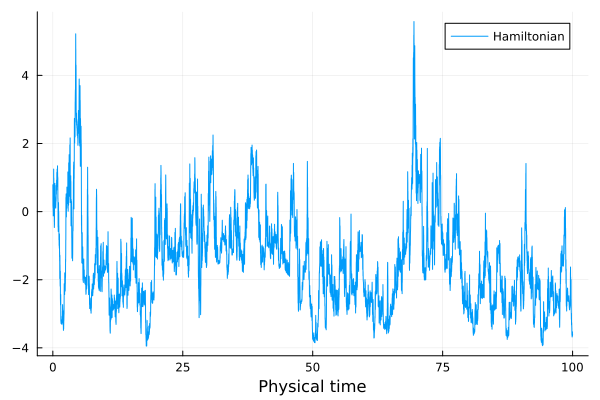

In [9]:
plot(collect(1:Nmax)*Δt, [hamiltonian(positions[i,:], momenta[i,:], entropic_switch) for i in 1:Nmax], label="Hamiltonian")
xlabel!("Physical time")

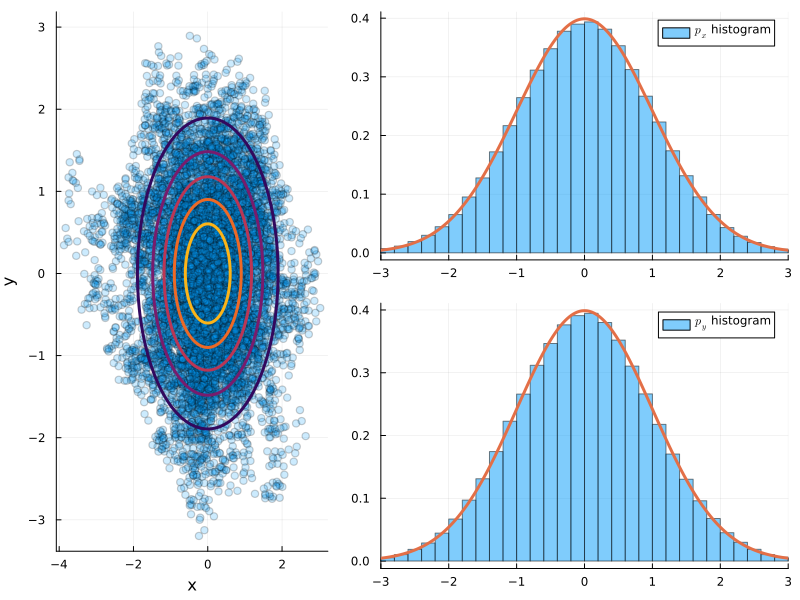

In [10]:
xlims = -3/sqrt(β), 3/sqrt(β)
ylims = -3/sqrt(β), 3/sqrt(β)
xrange = range(xlims..., 200)
yrange = range(ylims..., 200)
pl_p = scatter(momenta[1:Nmax,1],momenta[1:Nmax,2],label="",alpha=0.2)
contour!(xrange, yrange, standard_gaussian, colorbar=false, levels=5,linewidth=3)
xlabel!("x")
ylabel!("y")
hist_px = histogram(momenta[:,1],bins=50,normalize=:pdf,alpha=0.5,label=L"$p_x$ histogram")
plot!(xrange, standard_gaussian.(xrange), label="",linewidth=3)
xlims!(xlims)
hist_py = histogram(momenta[:,2],bins=50,normalize=:pdf,alpha=0.5,label=L"$p_y$ histogram")
plot!(yrange, standard_gaussian.(yrange), label="",linewidth=3)
xlims!(xlims)

pl = plot(
    pl_p, hist_px, hist_py, layout=@layout([°{0.4w} [°;°]]), size=(800,600)
)


<b><u>Tasks.</u> Play around with the hyperparameters ($\Delta t,T$) and the system's parameters ($\beta,\gamma$).</b>
* What happens when $\beta\uparrow$ ? When $\beta\downarrow$ ? Interpret, recalling that $\beta^{-1}=k_b T$ where $k_b$ is the Boltzmann's constant and $T$ is the temperature of the heat bath.
* What happens when $\gamma\uparrow$ ? When $\gamma\downarrow$ ? Interpret, recalling the [(Langevin) dynamics](#langevin) and the solution to the [Ornstein-Uhlenbeck](#ou_process) process.
* What happens when $\Delta t\uparrow$ ? When $\Delta t\downarrow$ ? Especially, look at the equilibrium distribution of the momenta when $\Delta t=0.5$.

<b><u>Tasks.</u> It is time to code a bit !</b>
* Code the ABOBA integrator, following the same structure as for the function ```BAOAB!``` (see [this cell](#baoab)).
* Even though the Ornstein-Uhlenbeck can be solved anatycally, the exact form of its solution is cumbersome to compute for more complex systems (<i>e.g.</i> for constrained processes, or when using anisotropic multiplicative noise). Therefore, a simple midpoint Euler scheme is often used. This scheme reads
$$
\tag{Midpoint Euler}
p^1 = p^0 - \frac{\Delta t}{2}\gamma M^{-1}(p^0+p^1)+\sqrt{\frac{2\gamma\Delta t}{\beta}} {\rm G}^1,\qquad {\rm G}^1\sim\mathcal{N}(0,{\rm I}_{dN}).
$$
Define the function ```BAOAB_midpoint!``` based on the BAOAB integrator which uses this update instead of the analytical one. You may want to use the ```\``` operator.
* A variant of the OBABO integrator is the Brünger-Brooks-Karplus (BBK) integrator, which is given by
$$
\tag{BBK}
\left\lbrace
\begin{aligned}
p^{1/2} &= p^0 -\frac{\Delta t}{2}\nabla V(q^0)-\frac{\Delta t}{2}\gamma M^{-1}p^0+\sqrt{\frac{\gamma \Delta t}{\beta}}{\rm G}^{1/2},\\
q^{1} &= q^0 + \Delta t M^{-1} p^{1/2},\\
p^{1} &= p^{1/2}-\frac{\Delta t}{2}\nabla V(q^{1})-\frac{\Delta t}{2}\gamma M^{-1}p^1+\sqrt{\frac{\gamma\Delta t}{\beta}}{\rm G}^1,
\end{aligned}
\right.
$$
where~$({\rm G}^{1/2},{\rm G}^1)$ is a pair of i.i.d. Gaussian random vectors with zero mean and covariance ${\rm I}_{dN}$. Define the function ```BBK!``` based on this scheme.